In [1]:
import os 
import sys 
import re 
import yaml
import inspect 
import numpy as np 
import pandas as pd
import xarray as xr
from collections import defaultdict
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.colors import ListedColormap

from scipy.io import savemat
from collections import OrderedDict

In [2]:
#Plot formatting
mpl.rcParams['xtick.labelsize'] = 15
mpl.rcParams['ytick.labelsize'] = 15
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['axes.titlesize'] = 28
mpl.rcParams['axes.xmargin'] = 0

# Set the font family to 'serif'
mpl.rcParams['font.family'] = 'serif'
# Specify preferred serif font (Computer Modern Roman is 'cmr10')
mpl.rcParams['font.serif'] = 'Lato' 
# Optionally, configure mathtext to use Computer Modern fonts as well
mpl.rcParams['mathtext.fontset'] = 'cm'
# Ensure minus signs are rendered correctly with CM fonts
mpl.rcParams['axes.unicode_minus'] = False

In [3]:
# Main datapaths
dirpath = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/'
#define path for Hawthorne data directory
savepath= dirpath + 'Merge_scripts/'
plots_savepath= dirpath + 'Merge_scripts/plots/'

In [18]:
#Get names of variables needed from Mobile Lab and UDAQ dataset
mappings_filepath = dirpath + 'Hawthorne_data/mappings/manually_edited/UDAQ_Hawthorne_CRACMM_GEOSCHEM_CB6r5h_mapped_updated_11172025.csv'
df_mapping_parameters = pd.read_csv(mappings_filepath)
df_mapping_parameters = df_mapping_parameters.drop([0]) #drop Total NMVOCs

usos_vars = [str(spec) for spec in df_mapping_parameters['USOS Mapping'].dropna()]
usos_vars.append('time_local')
print(usos_vars)

['Ethane_WAS', 'Ethene_WAS', 'Propane_WAS', 'Propene_WAS', 'Ethyne_WAS', 'nButane_WAS', 'iButane_WAS', 't2Butene_WAS', 'c2Butene_WAS', 'x13_Butadiene_WAS', 'nPentane_WAS', 'iPentane_WAS', 'x1_Pentene_WAS', 't2Pentene_WAS', 'c2Pentene_WAS', 'x3_MethylPentane_WAS', 'nHexane_WAS', 'nHeptane_WAS', 'nOctane_WAS', 'nNonane_WAS', 'nDecane_WAS', 'CycloPentane_WAS', 'Isoprene_PTR', 'x22_DiMethylButane_WAS', 'x224_TriMethylPentane_WAS', 'MethylCycloHexane_WAS', 'MethylCycloPentane_WAS', 'x1_Butene_WAS', 'x2_MethylPentane_WAS', 'HCHO_CRDS', 'm_p_Xylene_WAS', 'Benzene_PTR', 'Toluene_PTR', 'Ethyl_WAS', 'o_Xylene_WAS', 'x135_TriMethylBenzene_WAS', 'x124_TriMethylBenzene_WAS', 'nPropylBenzene_WAS', 'iPropylBenzene_WAS', 'x2_EthylToluene_WAS', 'x3_x4_EthylToluene_WAS', 'x3_x4_EthylToluene_WAS', 'Styrene_PTR', 'x123_TriMethylBenzene_WAS', 'time_local']


In [11]:
ml_data = xr.open_dataset('/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/CampaignData_and_Merges/R0/CSL_MobileLab_Parked/merged/rev_15min/all_CSL_MobileLab_Parked_rev15min_iWASupdated.nc')
ml_data_vars_subset = ml_data[usos_vars]
df_ml_data = ml_data_vars_subset.to_dataframe()
df_ml_data.set_index('time_local', inplace=True)

udaq_voc_file = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/Hawthorne_data/data/hawthorne_udaq_all_vocs_15min_timezone_carbon_number_updated.csv'
df_udaq_data = pd.read_csv(udaq_voc_file, index_col='time_local', parse_dates=True)

#Get only the data during the overlapping times
df_ml_data = df_ml_data.sort_index().loc['2024-07-15 00:00:00':'2024-08-17 23:45:00']
df_udaq_data = df_udaq_data.sort_index().loc['2024-07-15 00:00:00':'2024-08-17 23:45:00']

In [12]:
mapping = dict(zip(df_mapping_parameters['USOS Mapping'], df_mapping_parameters['UDAQ_Variable']))
print(mapping)

{nan: 'pDiethylbenzene', 'Ethane_WAS': 'Ethane', 'Ethene_WAS': 'Ethylene', 'Propane_WAS': 'Propane', 'Propene_WAS': 'Propylene', 'Ethyne_WAS': 'Acetylene', 'nButane_WAS': 'nButane', 'iButane_WAS': 'Isobutane', 't2Butene_WAS': 'trans2Butene', 'c2Butene_WAS': 'cis2Butene', 'x13_Butadiene_WAS': 'buta13diene', 'nPentane_WAS': 'nPentane', 'iPentane_WAS': 'Isopentane', 'x1_Pentene_WAS': 'Pent1ene', 't2Pentene_WAS': 'trans2Pentene', 'c2Pentene_WAS': 'cis2Pentene', 'x3_MethylPentane_WAS': 'x3_Methylpentane', 'nHexane_WAS': 'nHexane', 'nHeptane_WAS': 'nHeptane', 'nOctane_WAS': 'nOctane', 'nNonane_WAS': 'nNonane', 'nDecane_WAS': 'nDecane', 'CycloPentane_WAS': 'Cyclopentane', 'Isoprene_PTR': 'Isoprene', 'x22_DiMethylButane_WAS': 'x22_Dimethylbutane', 'x224_TriMethylPentane_WAS': 'x224_Trimethylpentane', 'MethylCycloHexane_WAS': 'Methylcyclohexane', 'MethylCycloPentane_WAS': 'Methylcyclopentane', 'x1_Butene_WAS': 'But1ene', 'x2_MethylPentane_WAS': 'x2_Methylpentane', 'HCHO_CRDS': 'Formaldehyde', '

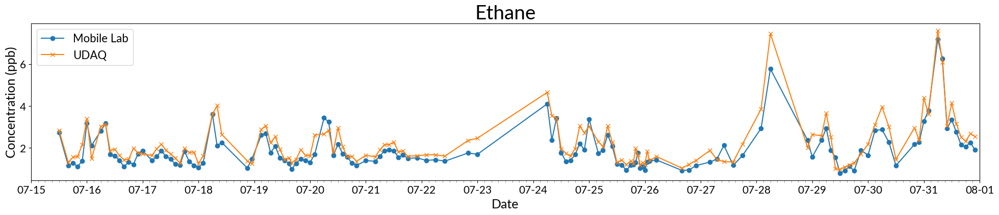

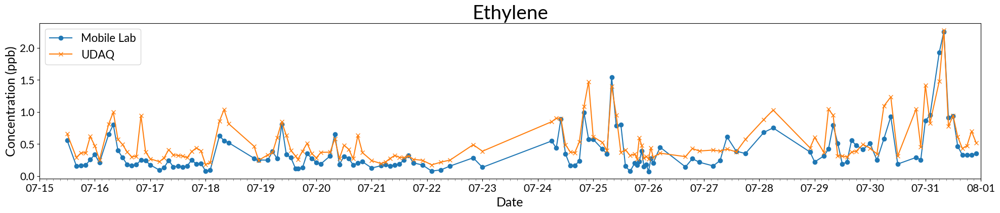

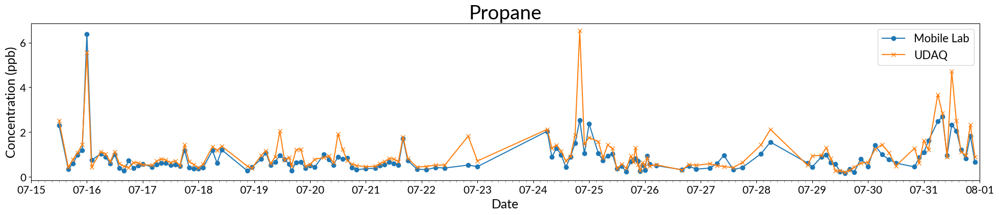

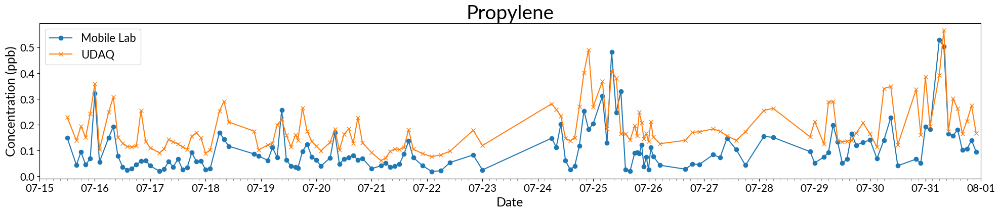

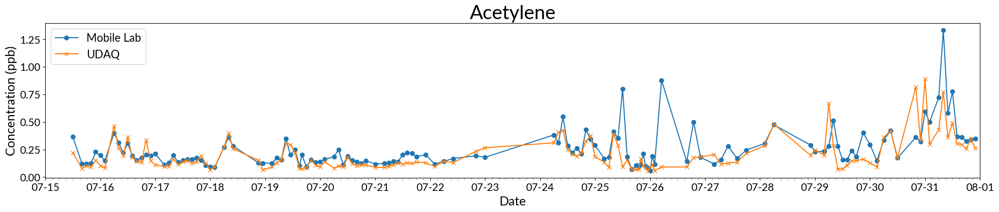

...

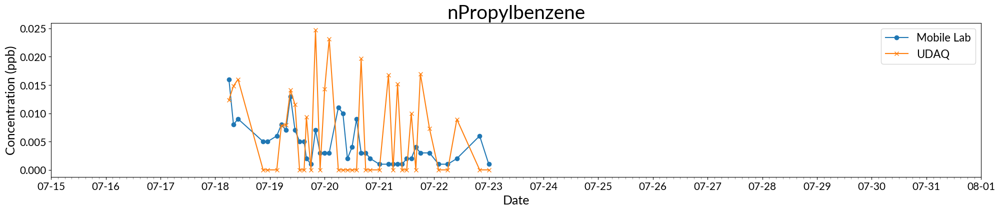

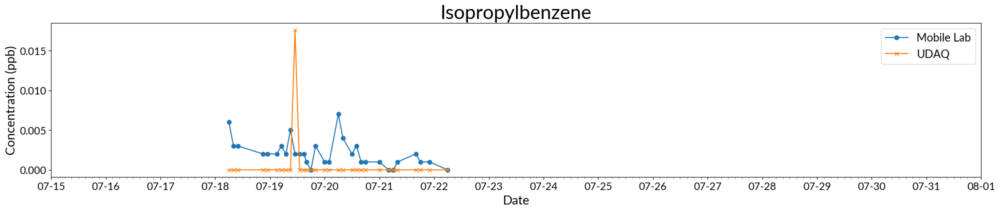

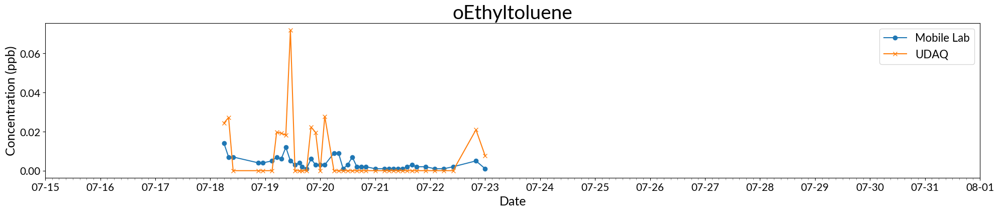

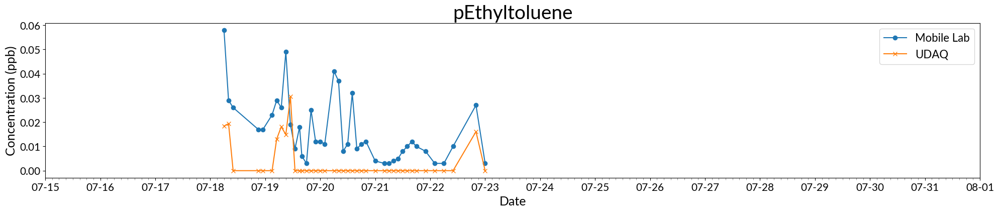

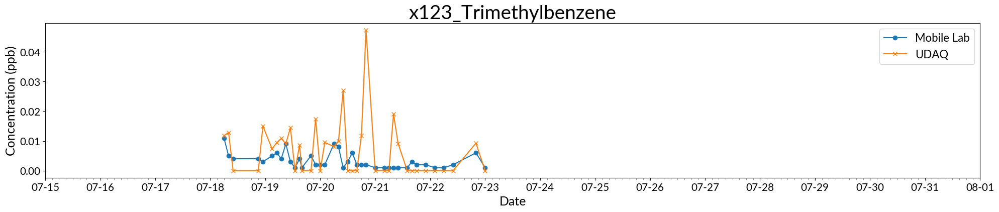

In [13]:
df_ml_data_july = df_ml_data.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']
df_udaq_data_july = df_udaq_data.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

for col1, col2 in mapping.items():
    # Make sure columns exist in both DataFrames
    if col1 in df_ml_data_july.columns and col2 in df_udaq_data_july.columns:
        # Align columns on the index and drop rows with NaNs
        pair = pd.concat([df_ml_data_july[col1], df_udaq_data_july[col2]], axis=1).dropna()
        
        if not pair.empty:  # only plot if there's data
            fig, ax = plt.subplots(figsize=(24, 4))
            
            ax.plot(pair.index, pair[col1], marker = 'o', label='Mobile Lab')
            ax.plot(pair.index, pair[col2], marker = 'x', label='UDAQ')
            
            ax.set_xlabel("Date")
            ax.set_ylabel("Concentration (ppb)")
            ax.set_title(f"{col2}")
            ax.legend()

            #Set x ticks
            ax.xaxis.set_major_locator(mdates.DayLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
            # Minor ticks: every 3 hours
            ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
            # Rotate and format tick labels
            ax.tick_params(axis='x', which='major')
            ax.tick_params(axis='x', which='minor', length=3, color='gray')
            
            ax.set_xlim([pd.Timestamp("2024-07-15"), pd.Timestamp("2024-08-01")])
            # # Optional: align y-axis scale if needed
            # min_val = np.nanmin(pair.values)
            # max_val = np.nanmax(pair.values)
            # ax.set_ylim(min_val, max_val)
            
            plt.show()

/tmp/ipykernel_1272344/1905675775.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (16,4))


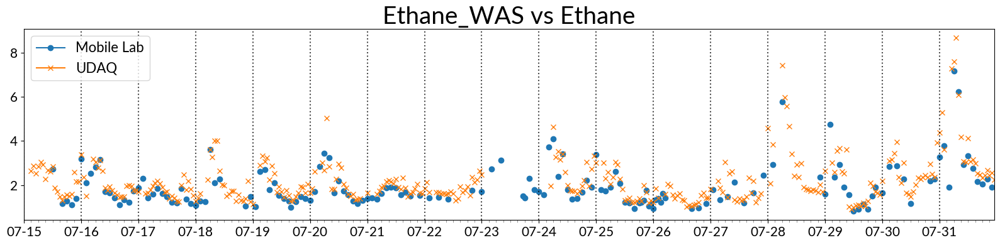

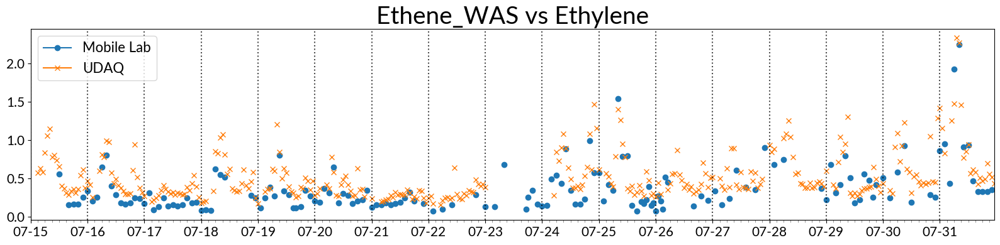

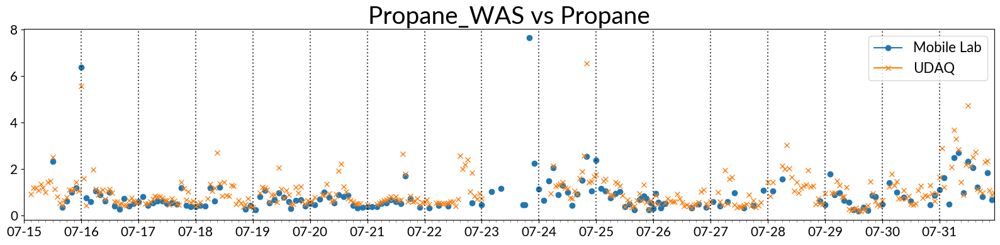

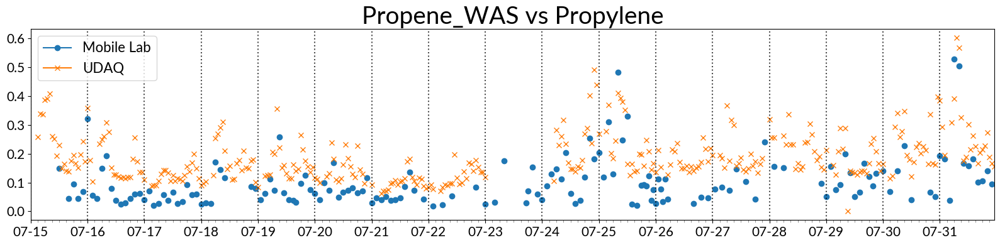

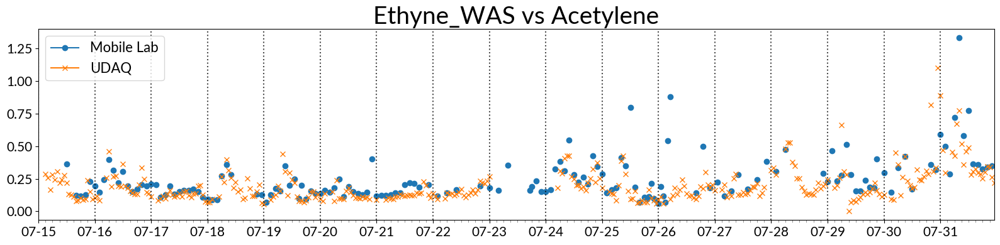

...

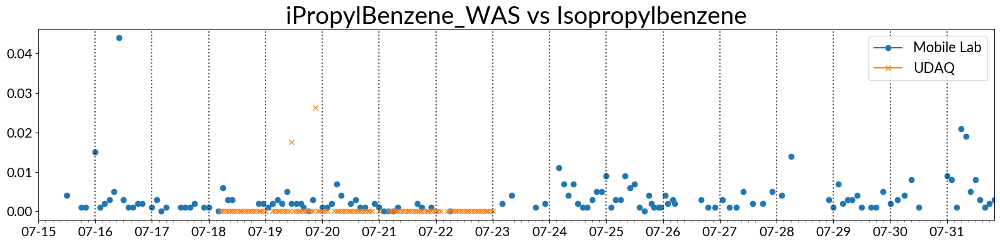

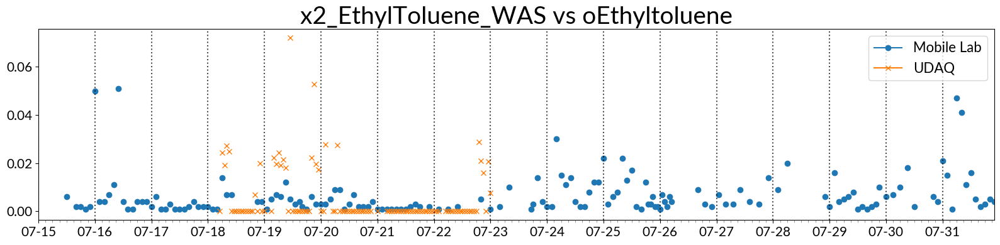

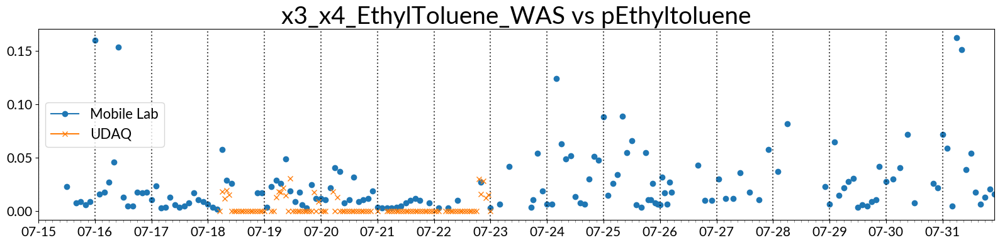

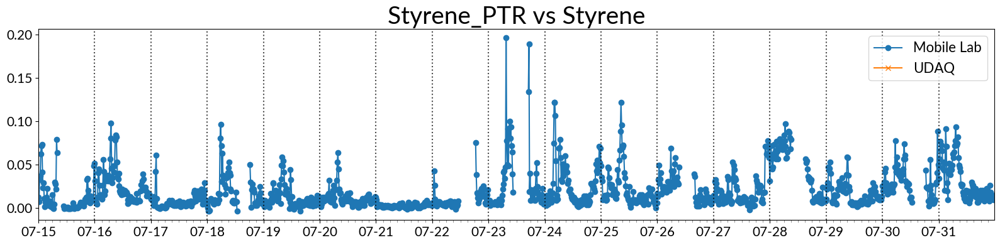

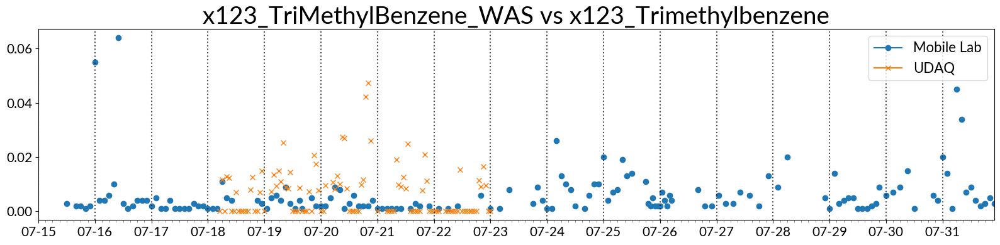

In [14]:
df_ml_data_july = df_ml_data.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']
df_udaq_data_july = df_udaq_data.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

for col1, col2 in mapping.items():
    if col1 in df_ml_data_july.columns and col2 in df_udaq_data_july.columns:
        fig, ax = plt.subplots(figsize = (16,4))
        plt.plot(df_ml_data_july.index, df_ml_data_july[col1], linestyle = 'solid', marker = 'o', label='Mobile Lab')
        plt.plot(df_udaq_data_july.index, df_udaq_data_july[col2], linestyle = 'solid', marker='x', label='UDAQ')
        #Mark midnight for every day
        midnight_vals = []
        for midnight_idx in range(0,len(df_udaq_data_july.index),96):
            midnight_vals.append(df_udaq_data_july.index[midnight_idx])
        for day_pos in midnight_vals:
            ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)
        #Set x ticks
        ax.xaxis.set_major_locator(mdates.DayLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
        # Minor ticks: every 3 hours
        ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
        # Rotate and format tick labels
        ax.tick_params(axis='x', which='major')
        ax.tick_params(axis='x', which='minor', length=3, color='gray')

        plt.title(f"{col1} vs {col2}")
        plt.tight_layout()
        plt.legend()

/tmp/ipykernel_1272344/345685501.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (16,4))


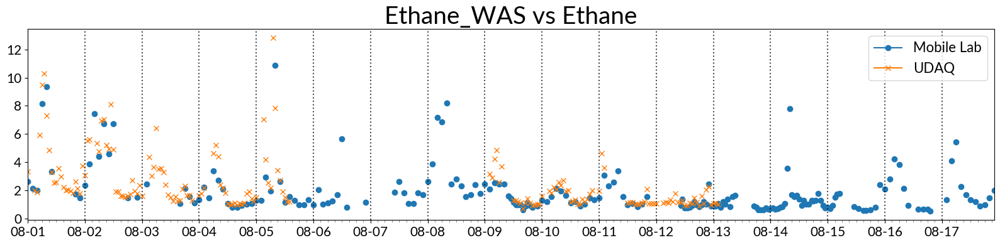

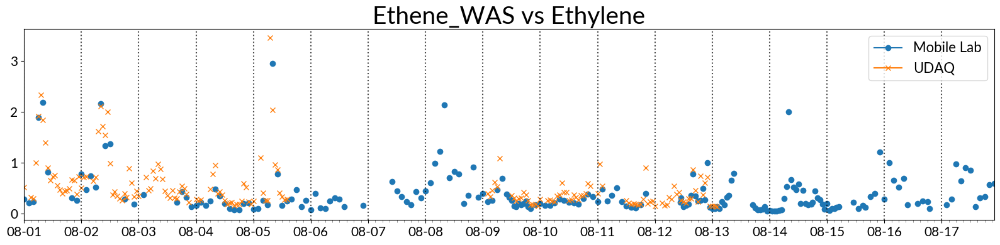

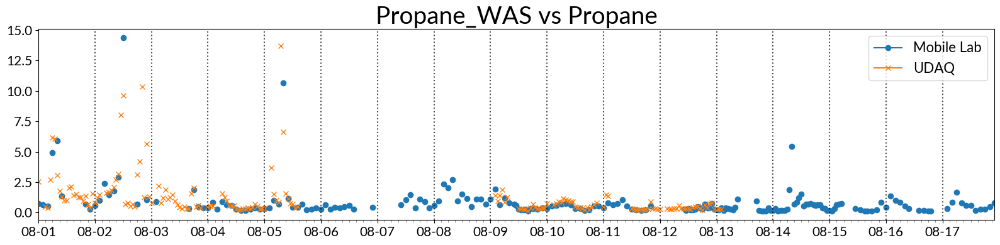

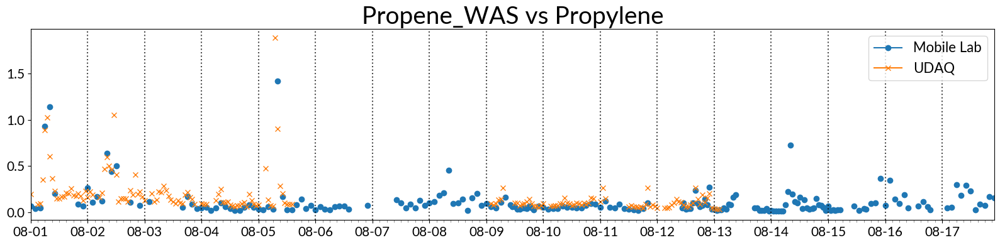

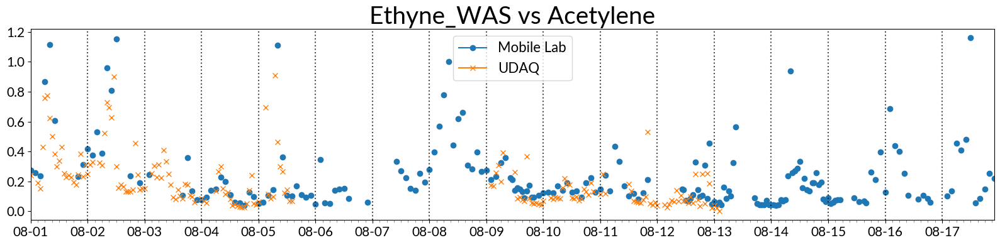

...

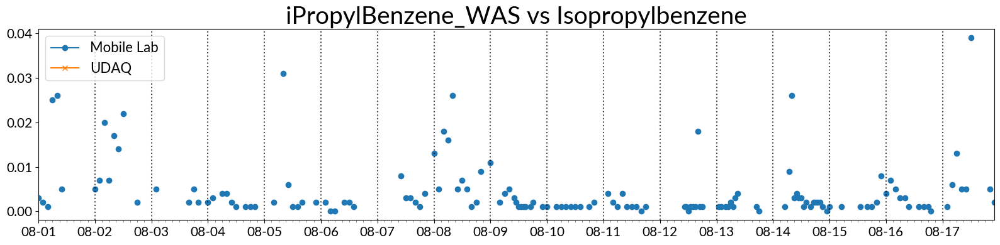

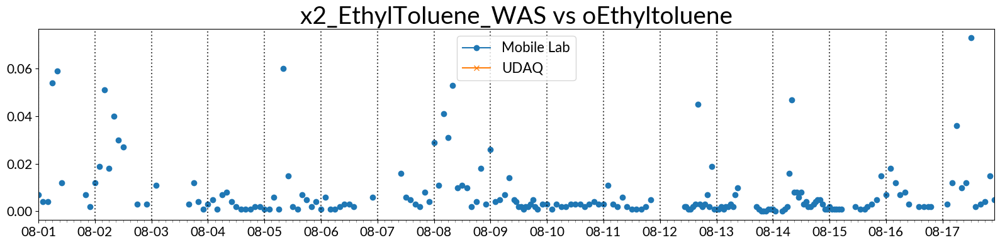

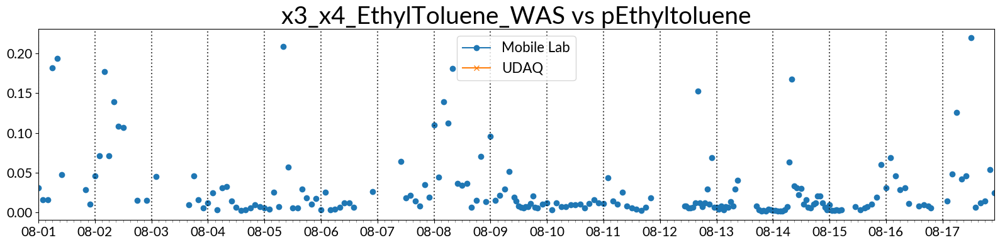

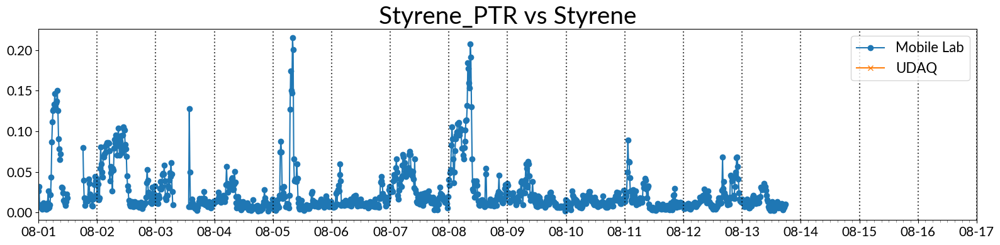

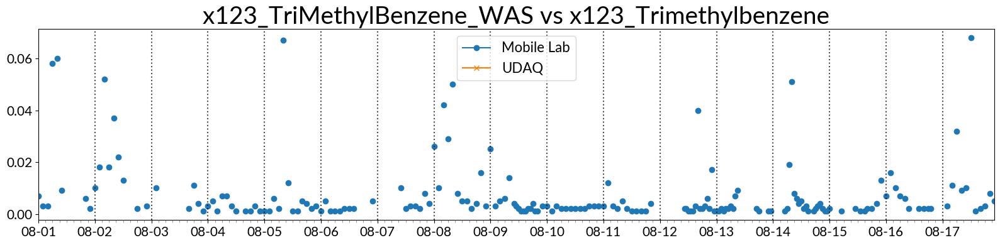

In [15]:
df_ml_data_aug = df_ml_data.sort_index().loc['2024-08-01 00:00:00':'2024-08-17 23:45:00']
df_udaq_data_aug = df_udaq_data.sort_index().loc['2024-08-01 00:00:00':'2024-08-17 23:45:00']

for col1, col2 in mapping.items():
    if col1 in df_ml_data_aug.columns and col2 in df_udaq_data_aug.columns:
        fig, ax = plt.subplots(figsize = (16,4))
        plt.plot(df_ml_data_aug.index, df_ml_data_aug[col1],marker='o', label='Mobile Lab')
        plt.plot(df_udaq_data_aug.index, df_udaq_data_aug[col2],marker='x', label='UDAQ')
        #Mark midnight for every day
        midnight_vals = []
        for midnight_idx in range(0,len(df_udaq_data_aug.index),96):
            midnight_vals.append(df_udaq_data_aug.index[midnight_idx])
        for day_pos in midnight_vals:
            ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)
        #Set x ticks
        ax.xaxis.set_major_locator(mdates.DayLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
        # Minor ticks: every 3 hours
        ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
        # Rotate and format tick labels
        ax.tick_params(axis='x', which='major')
        ax.tick_params(axis='x', which='minor', length=3, color='gray')

        plt.title(f"{col1} vs {col2}")
        plt.tight_layout()
        plt.legend()

/tmp/ipykernel_1065605/3757485463.py:26: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_1065605/3757485463.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (5,5))
/tmp/ipykernel_1065605/3757485463.py:6: RuntimeWarning: All-NaN axis encountered
  min_val = min(np.nanmin(df_ml_data[col1]), np.nanmin(df_udaq_data[col2]))
/tmp/ipykernel_1065605/3757485463.py:7: RuntimeWarning: All-NaN axis encountered
  max_val = max(np.nanmax(df_ml_data[col1]), np.nanmax(df_udaq_data[col2]))


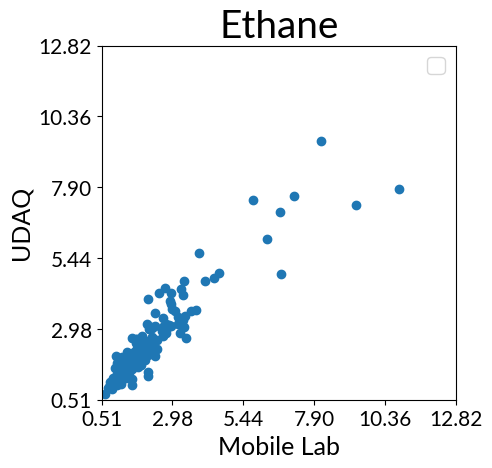

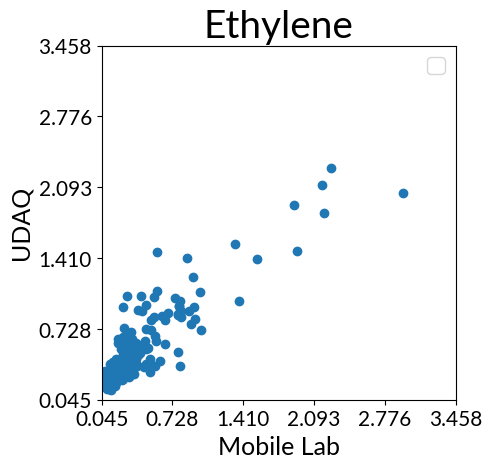

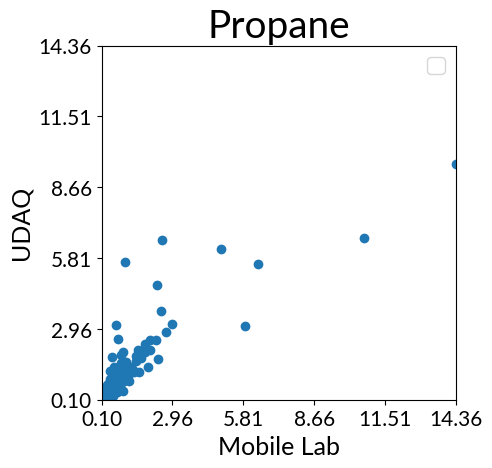

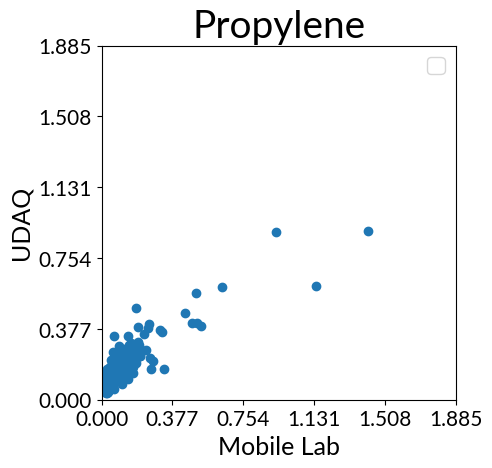

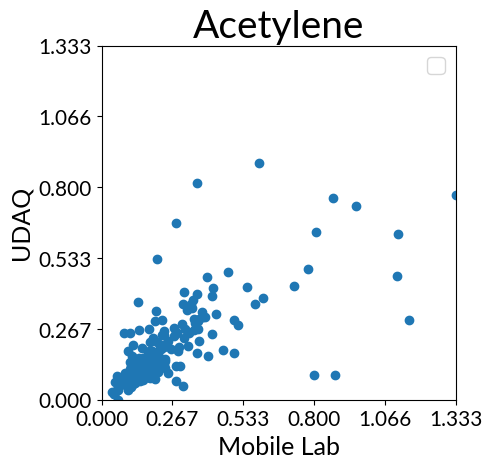

...

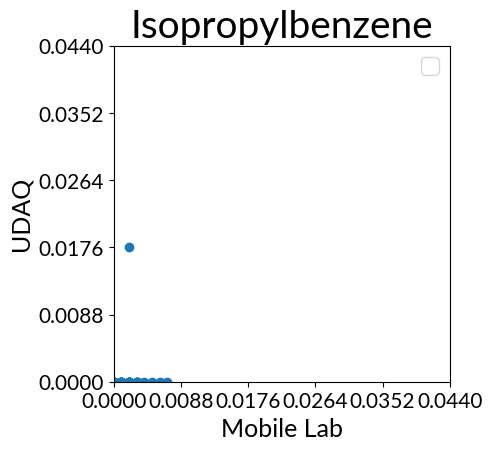

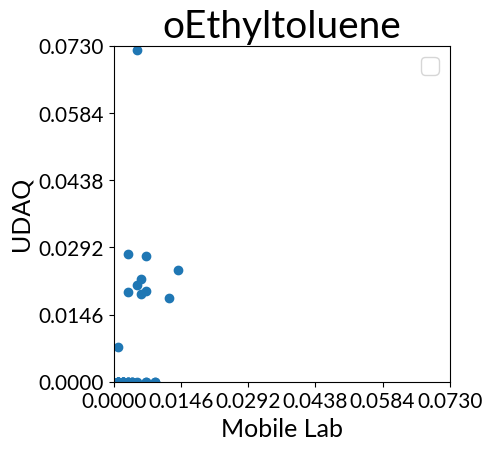

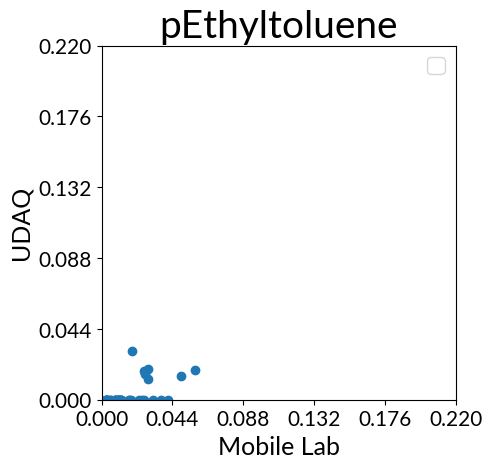

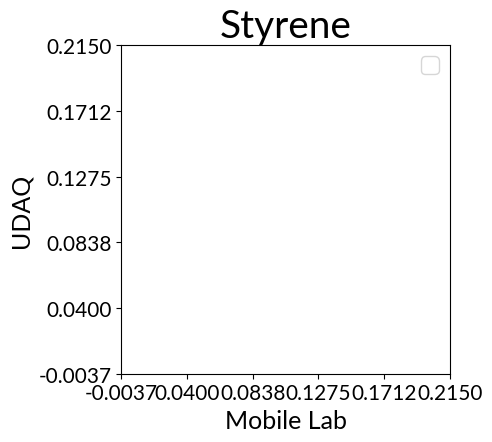

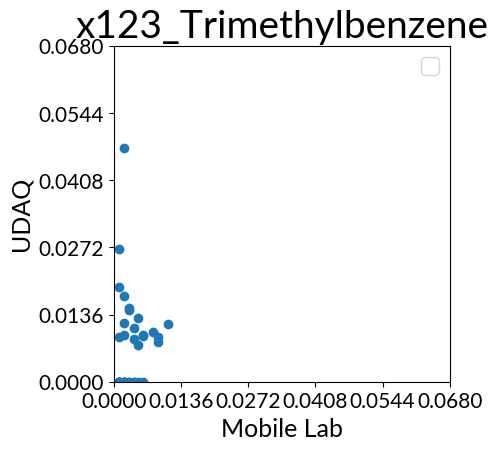

In [74]:
for col1, col2 in mapping.items():
    if col1 in df_ml_data_july.columns and col2 in df_udaq_data_july.columns:
        fig, ax = plt.subplots(figsize = (5,5))
        ax.scatter(df_ml_data[col1], df_udaq_data[col2])
        # 1) compute overall min/max
        min_val = min(np.nanmin(df_ml_data[col1]), np.nanmin(df_udaq_data[col2]))
        max_val = max(np.nanmax(df_ml_data[col1]), np.nanmax(df_udaq_data[col2]))

        # Compute shared tick locations
        ticks = np.linspace(min_val, max_val, 6)  # choose number of ticks

        ax.set_xticks(ticks)
        ax.set_yticks(ticks)
        
        # 2) apply same limits
        ax.set_xlim(min_val, max_val)
        ax.set_ylim(min_val, max_val)
        # ax.set_axis('equal')

        ax.set_aspect('equal', adjustable = 'box')

        plt.xlabel('Mobile Lab')
        plt.ylabel('UDAQ')
        plt.title(f"{col2}")
        plt.tight_layout()
        plt.legend()

In [ ]:
df_ml_data_july = df_ml_data.sort_index().loc['2024-07-19 00:00:00':'2024-07-20 00:00:00']
df_udaq_data_july = df_udaq_data.sort_index().loc['2024-07-19 00:00:00':'2024-07-20 00:00:00']

for col1, col2 in mapping.items():
    if col1 in df_ml_data_july.columns and col2 in df_udaq_data_july.columns:
        fig, ax = plt.subplots(figsize = (16,4))
        plt.plot(df_ml_data_july.index, df_ml_data_july[col1], linestyle = 'solid', marker = 'o', label='Mobile Lab')
        plt.plot(df_udaq_data_july.index, df_udaq_data_july[col2], linestyle = 'solid', marker='x', label='UDAQ')
        # #Mark midnight for every day
        # midnight_vals = []
        # for midnight_idx in range(0,len(df_udaq_data_july.index),96):
        #     midnight_vals.append(df_udaq_data_july.index[midnight_idx])
        # for day_pos in midnight_vals:
        #     ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)
        #Set x ticks
        # ax.xaxis.set_major_locator(mdates.DayLocator())
        # ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
        # Minor ticks: every 3 hours
        ax.xaxis.set_minor_locator(mdates.HourLocator())
        # Rotate and format tick labels
        ax.tick_params(axis='x', which='major')
        ax.tick_params(axis='x', which='minor', length=1, color='gray')

        plt.title(f"{col1} vs {col2}")
        plt.tight_layout()
        plt.legend()

/tmp/ipykernel_1272344/2151955519.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (16,4))


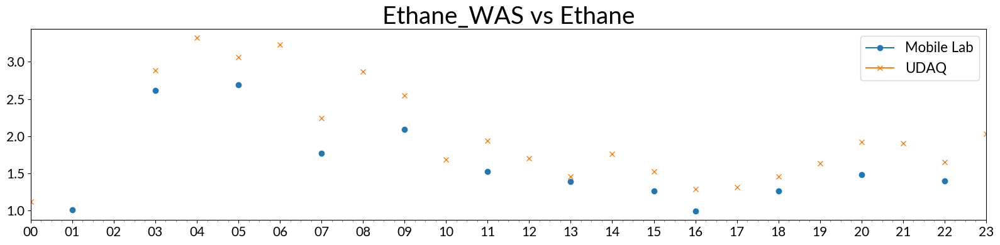

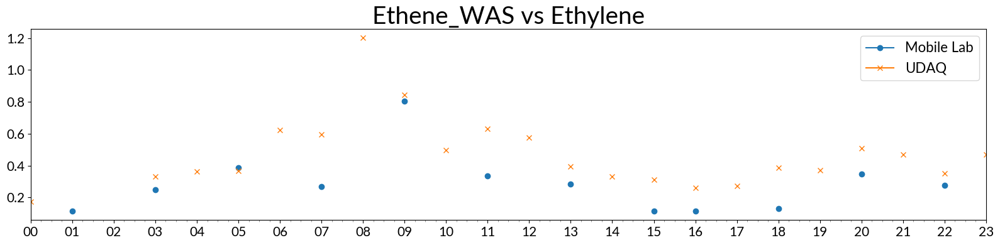

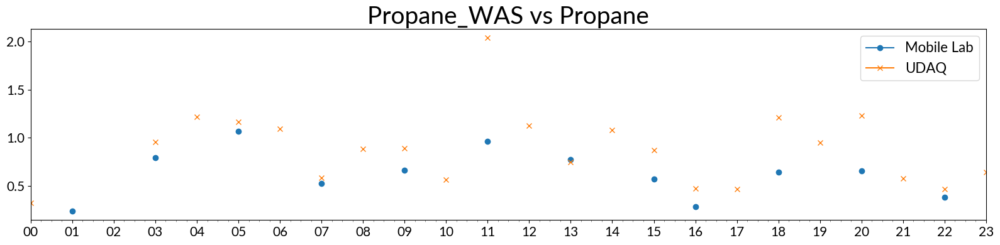

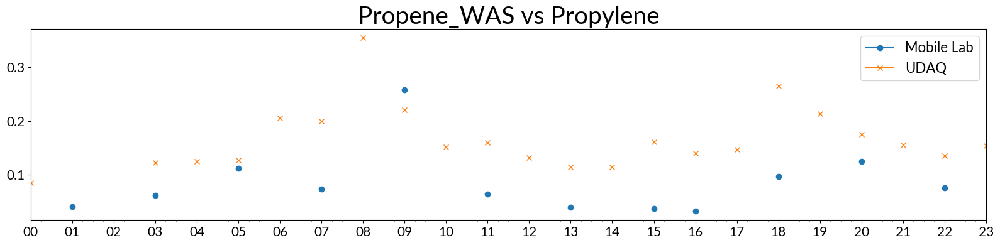

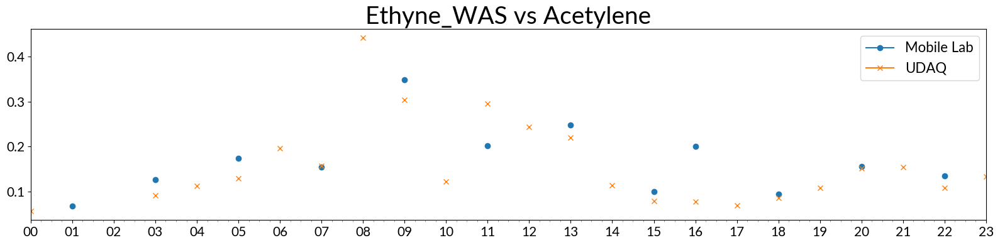

...

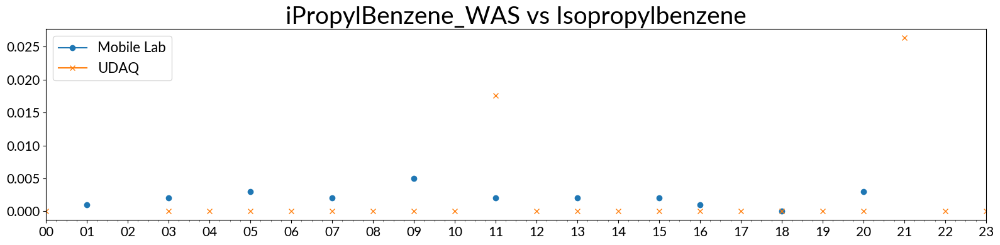

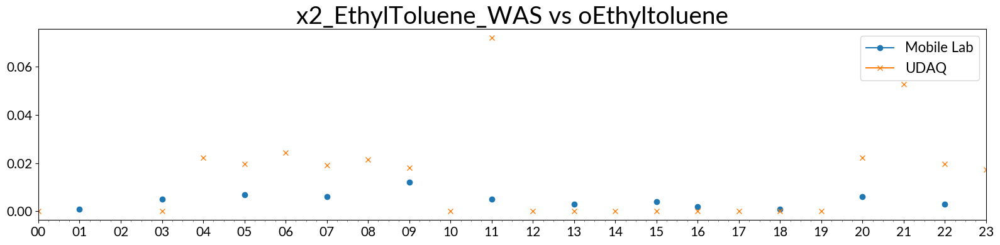

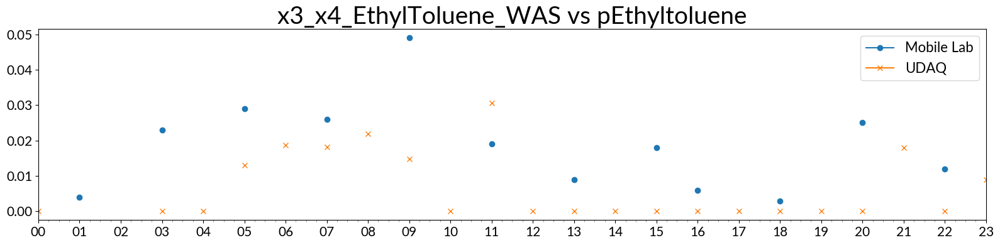

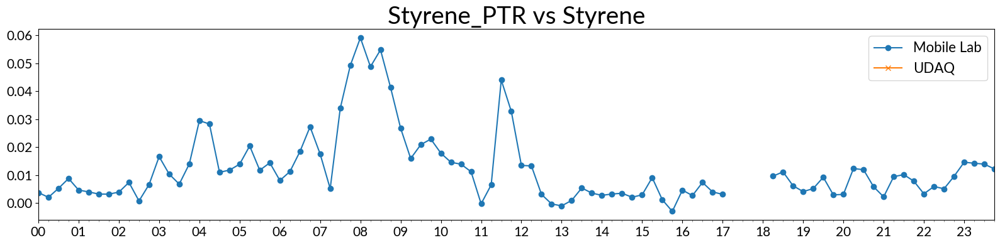

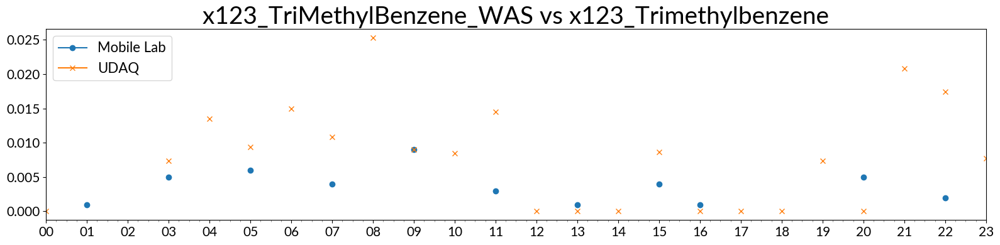

In [16]:
df_ml_data_july19 = df_ml_data.sort_index().loc['2024-07-19 00:00:00':'2024-07-19 23:45:00']
df_udaq_data_july19 = df_udaq_data.sort_index().loc['2024-07-19 00:00:00':'2024-07-19 23:45:00']

for col1, col2 in mapping.items():
    if col1 in df_ml_data_july19.columns and col2 in df_udaq_data_july19.columns:
        fig, ax = plt.subplots(figsize = (16,4))
        plt.plot(df_ml_data_july19.index, df_ml_data_july19[col1], linestyle = 'solid', marker = 'o', label='Mobile Lab')
        plt.plot(df_udaq_data_july19.index, df_udaq_data_july19[col2], linestyle = 'solid', marker='x', label='UDAQ')
        
        #Set x ticks
        ax.xaxis.set_major_locator(mdates.HourLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
        # Minor ticks: every 3 hours
        ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=15))
        # Rotate and format tick labels
        ax.tick_params(axis='x', which='major')
        ax.tick_params(axis='x', which='minor', color='gray')

        plt.title(f"{col1} vs {col2}")
        plt.tight_layout()
        plt.legend()

(np.float64(19919.0), np.float64(19936.0))

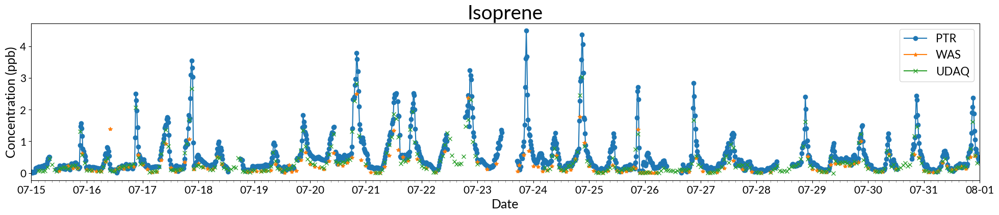

In [19]:
ml_isoprene = ml_data[['Isoprene_PTR', 'Isoprene_WAS', 'time_local']]
df_ml_isoprene = ml_isoprene.to_dataframe()
df_ml_isoprene.set_index('time_local', inplace=True)

df_ml_isoprene_july = df_ml_isoprene.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

fig, ax = plt.subplots(figsize=(24, 4))
            
ax.plot(df_ml_isoprene_july.index, df_ml_isoprene_july['Isoprene_PTR'], marker = 'o', label='PTR')
ax.plot(df_ml_isoprene_july.index, df_ml_isoprene_july['Isoprene_WAS'], marker = '*', label='WAS')
ax.plot(df_ml_isoprene_july.index, df_udaq_data_july['Isoprene'], marker = 'x', label = 'UDAQ')

ax.set_xlabel("Date")
ax.set_ylabel("Concentration (ppb)")
ax.set_title("Isoprene")
ax.legend()

#Set x ticks
ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

ax.set_xlim([pd.Timestamp("2024-07-15"), pd.Timestamp("2024-08-01")])

(np.float64(19923.0), np.float64(19924.0))

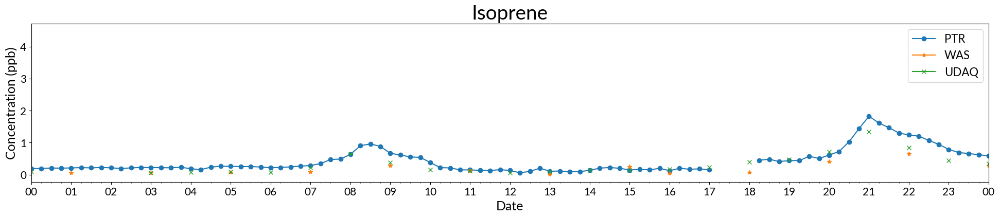

In [21]:
ml_isoprene = ml_data[['Isoprene_PTR', 'Isoprene_WAS', 'time_local']]
df_ml_isoprene = ml_isoprene.to_dataframe()
df_ml_isoprene.set_index('time_local', inplace=True)

df_ml_isoprene_july = df_ml_isoprene.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

fig, ax = plt.subplots(figsize=(24, 4))
            
ax.plot(df_ml_isoprene_july.index, df_ml_isoprene_july['Isoprene_PTR'], marker = 'o', label='PTR')
ax.plot(df_ml_isoprene_july.index, df_ml_isoprene_july['Isoprene_WAS'], marker = '*', label='WAS')
ax.plot(df_ml_isoprene_july.index, df_udaq_data_july['Isoprene'], marker = 'x', label = 'UDAQ')

ax.set_xlabel("Date")
ax.set_ylabel("Concentration (ppb)")
ax.set_title("Isoprene")
ax.legend()

#Set x ticks
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=15))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', color='gray')

ax.set_xlim([pd.Timestamp("2024-07-19"), pd.Timestamp("2024-07-20")])

(np.float64(19919.0), np.float64(19936.0))

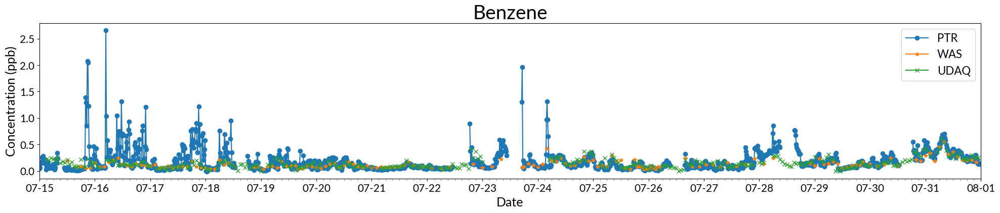

In [22]:
ml_Benzene = ml_data[['Benzene_PTR', 'Benzene_WAS', 'time_local']]
df_ml_Benzene = ml_Benzene.to_dataframe()
df_ml_Benzene.set_index('time_local', inplace=True)

df_ml_Benzene_july = df_ml_Benzene.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

fig, ax = plt.subplots(figsize=(24, 4))
            
ax.plot(df_ml_Benzene_july.index, df_ml_Benzene_july['Benzene_PTR'], marker = 'o', label='PTR')
ax.plot(df_ml_Benzene_july.index, df_ml_Benzene_july['Benzene_WAS'], marker = '*', label='WAS')
ax.plot(df_ml_Benzene_july.index, df_udaq_data_july['Benzene'], marker = 'x', label = 'UDAQ')

ax.set_xlabel("Date")
ax.set_ylabel("Concentration (ppb)")
ax.set_title("Benzene")
ax.legend()

#Set x ticks
ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

ax.set_xlim([pd.Timestamp("2024-07-15"), pd.Timestamp("2024-08-01")])

(np.float64(19923.0), np.float64(19924.0))

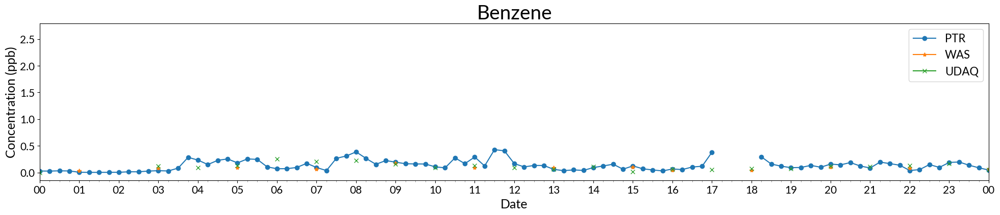

In [23]:
ml_Benzene = ml_data[['Benzene_PTR', 'Benzene_WAS', 'time_local']]
df_ml_Benzene = ml_Benzene.to_dataframe()
df_ml_Benzene.set_index('time_local', inplace=True)

df_ml_Benzene_july = df_ml_Benzene.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

fig, ax = plt.subplots(figsize=(24, 4))
            
ax.plot(df_ml_Benzene_july.index, df_ml_Benzene_july['Benzene_PTR'], marker = 'o', label='PTR')
ax.plot(df_ml_Benzene_july.index, df_ml_Benzene_july['Benzene_WAS'], marker = '*', label='WAS')
ax.plot(df_ml_Benzene_july.index, df_udaq_data_july['Benzene'], marker = 'x', label = 'UDAQ')

ax.set_xlabel("Date")
ax.set_ylabel("Concentration (ppb)")
ax.set_title("Benzene")
ax.legend()

#Set x ticks
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=15))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', color='gray')

ax.set_xlim([pd.Timestamp("2024-07-19"), pd.Timestamp("2024-07-20")])

(np.float64(19919.0), np.float64(19936.0))

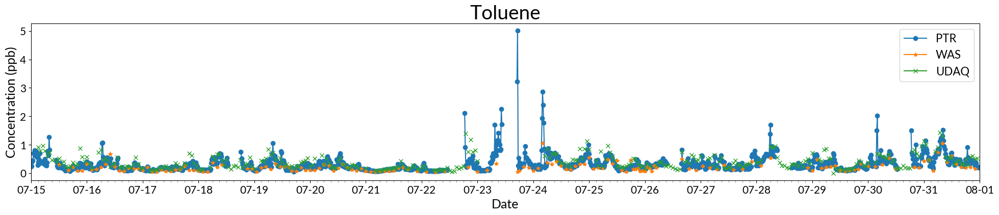

In [24]:
ml_Toluene = ml_data[['Toluene_PTR', 'Toluene_WAS', 'time_local']]
df_ml_Toluene = ml_Toluene.to_dataframe()
df_ml_Toluene.set_index('time_local', inplace=True)

df_ml_Toluene_july = df_ml_Toluene.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

fig, ax = plt.subplots(figsize=(24, 4))
            
ax.plot(df_ml_Toluene_july.index, df_ml_Toluene_july['Toluene_PTR'], marker = 'o', label='PTR')
ax.plot(df_ml_Toluene_july.index, df_ml_Toluene_july['Toluene_WAS'], marker = '*', label='WAS')
ax.plot(df_ml_Toluene_july.index, df_udaq_data_july['Toluene'], marker = 'x', label = 'UDAQ')

ax.set_xlabel("Date")
ax.set_ylabel("Concentration (ppb)")
ax.set_title("Toluene")
ax.legend()

#Set x ticks
ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

ax.set_xlim([pd.Timestamp("2024-07-15"), pd.Timestamp("2024-08-01")])

(np.float64(19923.0), np.float64(19924.0))

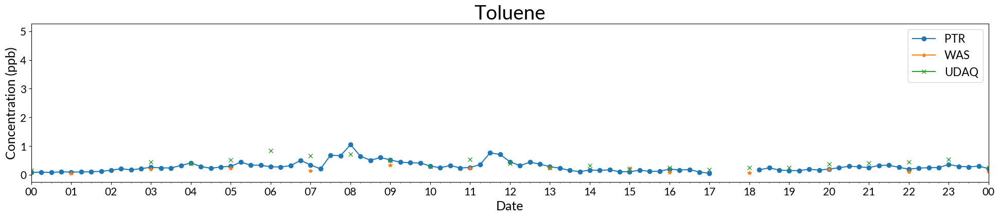

In [25]:
ml_Toluene = ml_data[['Toluene_PTR', 'Toluene_WAS', 'time_local']]
df_ml_Toluene = ml_Toluene.to_dataframe()
df_ml_Toluene.set_index('time_local', inplace=True)

df_ml_Toluene_july = df_ml_Toluene.sort_index().loc['2024-07-15 00:00:00':'2024-07-31 23:45:00']

fig, ax = plt.subplots(figsize=(24, 4))
            
ax.plot(df_ml_Toluene_july.index, df_ml_Toluene_july['Toluene_PTR'], marker = 'o', label='PTR')
ax.plot(df_ml_Toluene_july.index, df_ml_Toluene_july['Toluene_WAS'], marker = '*', label='WAS')
ax.plot(df_ml_Toluene_july.index, df_udaq_data_july['Toluene'], marker = 'x', label = 'UDAQ')

ax.set_xlabel("Date")
ax.set_ylabel("Concentration (ppb)")
ax.set_title("Toluene")
ax.legend()

#Set x ticks
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=15))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', color='gray')

ax.set_xlim([pd.Timestamp("2024-07-19"), pd.Timestamp("2024-07-20")])